In [1]:
## Importing packages
library(tibble)
library(stringr)
library(magrittr)
library(readr) #I/O library
#library(chron)
library(plyr) 
#library(knitr) # used for r Markdown for clean table visualization
#library(kableExtra) #

In [4]:
## Reading in files
flights <- read_delim("../input/flights/flights.txt", "|",escape_double = FALSE, trim_ws = TRUE)
flights <- as.data.frame(flights)
set.seed(0)
head(flights)

Parsed with column specification:
cols(
  .default = col_character(),
  TRANSACTIONID = col_double(),
  FLIGHTDATE = col_double(),
  FLIGHTNUM = col_double(),
  CRSDEPTIME = col_double(),
  DEPTIME = col_double(),
  DEPDELAY = col_double(),
  TAXIOUT = col_double(),
  WHEELSOFF = col_double(),
  WHEELSON = col_double(),
  TAXIIN = col_double(),
  CRSARRTIME = col_double(),
  ARRTIME = col_double(),
  ARRDELAY = col_double(),
  CRSELAPSEDTIME = col_double(),
  ACTUALELAPSEDTIME = col_double()
)

See spec(...) for full column specifications.



,TRANSACTIONID,FLIGHTDATE,AIRLINECODE,AIRLINENAME,TAILNUM,FLIGHTNUM,ORIGINAIRPORTCODE,ORIGAIRPORTNAME,ORIGINCITYNAME,ORIGINSTATE,⋯,WHEELSON,TAXIIN,CRSARRTIME,ARRTIME,ARRDELAY,CRSELAPSEDTIME,ACTUALELAPSEDTIME,CANCELLED,DIVERTED,DISTANCE
,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,54548800,20020101,WN,Southwest Airlines Co.: WN,N103@@,1425,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,1648,4,1655,1652,-3,90,87,F,False,580 miles
2,55872300,20020101,CO,Continental Air Lines Inc.: CO,N83872,150,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,1419,16,1426,1435,9,116,119,False,F,744 miles
3,54388800,20020101,WN,Southwest Airlines Co.: WN,N334@@,249,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,1618,2,1500,1620,80,105,102,F,False,718 miles
4,54486500,20020101,WN,Southwest Airlines Co.: WN,N699@@,902,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,1947,1,1950,1948,-2,85,83,0,0,487 miles
5,55878700,20020103,CO,Continental Air Lines Inc.: CO,N58606,234,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,1742,5,1750,1747,-3,115,114,F,False,744 miles
6,54380600,20020103,WN,Southwest Airlines Co.: WN,N501@@,193,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,1822,4,1805,1826,21,55,49,False,F,289 miles


In [5]:
#count the number of NAs
na.count <-sapply(flights, function(x) sum(is.na(x)))
na.count <- as.data.frame(na.count)
# show the missing values and the percent of each column that has data
na.count <- cbind(na.count, ((length(flights[,1])-na.count)/length(flights[,1])*100))
colnames(na.count)<-c("NA", "Filling Factor %")
na.count

#count the total number
na.total <- round(sum(na.count)/(length(flights[1,])*length(flights[,1]))*100, 3)
paste("TotaL NA %: ", na.total, sep = "")

,NA,Filling Factor %
,<int>,<dbl>
TRANSACTIONID,0,100.00000
FLIGHTDATE,0,100.00000
AIRLINECODE,0,100.00000
AIRLINENAME,0,100.00000
TAILNUM,156817,86.84206
FLIGHTNUM,0,100.00000
ORIGINAIRPORTCODE,0,100.00000
ORIGAIRPORTNAME,0,100.00000
ORIGINCITYNAME,0,100.00000


[1] "TotaL NA %: 2.913"

In [6]:
## CLEANING THE DATA ---------------------------

#convert distance column which is in string format to numeric
flights$DISTANCE <- gsub(" miles", "", flights$DISTANCE)
flights$DISTANCE <- as.numeric(flights$DISTANCE)

#  x is the hours column
# y is the flights dates column
# returns datetime object
changeTime <- function(x,y) {
  y <-paste(paste(substr(y, 1, 4), substr(y, 5, 6), sep = "-"),
            substr(y, 7, 8),
            sep = "-")
  x <- x %>% 
    str_pad(4, pad = "0", "left") %>% 
    str_pad(6, pad = "0", "right") 
  x <-paste(paste(substr(x, 1, 2), substr(x, 3, 4), sep = ":"), substr(x, 5, 6), sep =
              ":")
  yx <- paste(y, x, sep = " ")
  yx <- as.POSIXct(yx, format = "%Y-%m-%d %H:%M:%S")
  return(yx)
}

flights$CRSDEPTIME <- changeTime(flights$CRSDEPTIME, flights$FLIGHTDATE)
flights$DEPTIME <- changeTime(flights$DEPTIME, flights$FLIGHTDATE)
flights$CRSARRTIME <- changeTime(flights$CRSARRTIME, flights$FLIGHTDATE)
flights$ARRTIME <- changeTime(flights$ARRTIME, flights$FLIGHTDATE)
flights$WHEELSOFF <- changeTime(flights$WHEELSOFF, flights$FLIGHTDATE)
flights$WHEELSON <- changeTime(flights$WHEELSON, flights$FLIGHTDATE)
# to add time +1 is 1 second.

# Convert the date column which is itneger to date object
flights$FLIGHTDATE <- as.POSIXct(as.character(flights$FLIGHTDATE), format = "%Y%m%d")

# In the cancel and diverted boolean columns the data needs to be reduced to 1 value. 
# Currently for False it also has 0 and F
flights$DIVERTED[flights$DIVERTED == "F"] <- "False"
flights$DIVERTED[flights$DIVERTED == "0"] <- "False"
flights$DIVERTED[flights$DIVERTED == "T"] <- "True"
flights$DIVERTED[flights$DIVERTED == "1"] <- "True"

flights$CANCELLED[flights$CANCELLED == "F"] <- "False"
flights$CANCELLED[flights$CANCELLED == "0"] <- "False"
flights$CANCELLED[flights$CANCELLED == "T"] <- "True"
flights$CANCELLED[flights$CANCELLED == "1"] <- "True"

head(flights)

,TRANSACTIONID,FLIGHTDATE,AIRLINECODE,AIRLINENAME,TAILNUM,FLIGHTNUM,ORIGINAIRPORTCODE,ORIGAIRPORTNAME,ORIGINCITYNAME,ORIGINSTATE,⋯,WHEELSON,TAXIIN,CRSARRTIME,ARRTIME,ARRDELAY,CRSELAPSEDTIME,ACTUALELAPSEDTIME,CANCELLED,DIVERTED,DISTANCE
,<dbl>,<dttm>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<dttm>,<dbl>,<dttm>,<dttm>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
1,54548800,2002-01-01,WN,Southwest Airlines Co.: WN,N103@@,1425,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,2002-01-01 16:48:00,4,2002-01-01 16:55:00,2002-01-01 16:52:00,-3,90,87,False,False,580
2,55872300,2002-01-01,CO,Continental Air Lines Inc.: CO,N83872,150,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,2002-01-01 14:19:00,16,2002-01-01 14:26:00,2002-01-01 14:35:00,9,116,119,False,False,744
3,54388800,2002-01-01,WN,Southwest Airlines Co.: WN,N334@@,249,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,2002-01-01 16:18:00,2,2002-01-01 15:00:00,2002-01-01 16:20:00,80,105,102,False,False,718
4,54486500,2002-01-01,WN,Southwest Airlines Co.: WN,N699@@,902,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,2002-01-01 19:47:00,1,2002-01-01 19:50:00,2002-01-01 19:48:00,-2,85,83,False,False,487
5,55878700,2002-01-03,CO,Continental Air Lines Inc.: CO,N58606,234,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,2002-01-03 17:42:00,5,2002-01-03 17:50:00,2002-01-03 17:47:00,-3,115,114,False,False,744
6,54380600,2002-01-03,WN,Southwest Airlines Co.: WN,N501@@,193,ABQ,AlbuquerqueNM: Albuquerque International Sunport,Albuquerque,NM,⋯,2002-01-03 18:22:00,4,2002-01-03 18:05:00,2002-01-03 18:26:00,21,55,49,False,False,289


In [7]:
# find unique combinations of ORIGINSTATENAME and ORIGINAIRPORTCODE, but not when ORIGINAIRPORTCODE is NA
uniques <- unique(flights[c("ORIGINAIRPORTCODE", "ORIGINSTATENAME","ORIGINSTATE")])
#uniques <- uniques[!is.na(uniques$ORIGINAIRPORTCODE),]

# find which indexes are NA values
index <-which(is.na(flights$ORIGINSTATENAME))
# populate those NA values with the airport code
temp <- flights$ORIGINAIRPORTCODE[index]

# see what airport codes that we are investigating
print("Airport codes that we are investigating")
unique(temp)

[1] "Airport codes that we are investigating"


[1] "LAW" "MHK" "HYS" "OKC" "FOE" "TUL" "ICT" "GCK"

In [8]:
# LAW = Oklahoma 
# MHK = Kansas 
# HYS = Kansas
# OKC = Oklahoma
# FOE = Kansas
# TUL = Oklahoma
# ICT = Kansas
# GCK = Kandas
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == 'LAW'] <- "Oklahoma"
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == "TUL"] <- "Oklahoma"
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == 'OKC'] <- "Oklahoma"
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == 'MHK'] <- "Kansas"
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == "HYS"] <- "Kansas"
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == 'FOE'] <- "Kansas"
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == 'GCK'] <- "Kansas"
uniques$ORIGINSTATENAME[uniques$ORIGINAIRPORTCODE == 'ICT'] <- "Kansas"

# change the airport code to the corresponding Origin state using the library built
temp <- uniques$ORIGINSTATENAME[match(temp,uniques$ORIGINAIRPORTCODE)]
flights$ORIGINSTATENAME[index] <- temp
print("The total number of missing values in ORIGINSTATENAME:")
sum(is.na(flights$ORIGINSTATENAME))

[1] "The total number of missing values in ORIGINSTATENAME:"


[1] 0

In [9]:
index <-which(is.na(flights$ORIGINSTATE))
# populate those NA values with the airport code
temp <- flights$ORIGINAIRPORTCODE[index]

# see what airport codes that we are investigating
print("Airport codes that we are investigating")
unique(temp)
# we see that several of the airport codes have corresponding NA values for Origin State 
# maunaully look up the states for these values and input them into the dictionary

# LAW = Oklahoma 
# MHK = Kansas 
# HYS = Kansas
# OKC = Oklahoma
# FOE = Kansas
# TUL = Oklahoma
# ICT = Kansas
# GCK = Kandas
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == 'LAW'] <- "OK"
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == "TUL"] <- "OK"
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == 'OKC'] <- "OK"
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == 'MHK'] <- "KS"
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == "HYS"] <- "KS"
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == 'FOE'] <- "KS"
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == 'GCK'] <- "KS"
uniques$ORIGINSTATE[uniques$ORIGINAIRPORTCODE == 'ICT'] <- "KS"

# change the airport code to the corresponding Origin state using the library built
temp <- uniques$ORIGINSTATE[match(temp,uniques$ORIGINAIRPORTCODE)]
flights$ORIGINSTATE[index] <- temp
print("The total number of missing values in ORIGINSTATE:")
sum(is.na(flights$ORIGINSTATE))

[1] "Airport codes that we are investigating"


[1] "LAW" "MHK" "HYS" "OKC" "FOE" "TUL" "ICT" "GCK"

[1] "The total number of missing values in ORIGINSTATE:"


[1] 0

In [10]:
# find unique combinations of ORIGINSTATENAME and ORIGINAIRPORTCODE, but not when ORIGINAIRPORTCODE is NA
uniques <- unique(flights[c("ORIGINAIRPORTCODE", "DESTSTATENAME","DESTSTATE")])
#uniques <- uniques[!is.na(uniques$ORIGINAIRPORTCODE),]

# find which indexes are NA values
index <-which(is.na(flights$DESTSTATENAME))
# populate those NA values with the airport code
temp <- flights$ORIGINAIRPORTCODE[index]

# see what airport codes that we are investigating
print("Airport codes that we are investigating")
unique(temp)
# we see that several of the airport codes have corresponding NA values for Origin State Name
# maunaully look up the states for these values and input them into the dictionary

uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'ATL'] <- "Georgia"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == "ORD"] <- "Illinois"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'BWI'] <- "Maryland"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'DFW'] <- "Texas"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == "LAS"] <- "Nevada"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'LIT'] <- "Arkansas"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'LAX'] <- "California"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'MCI'] <- "Missouri"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'IAH'] <- "Texas"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'HOU'] <- "Texas"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'MEM'] <- "Tennessee"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'EWR'] <- "New Jersey"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'OKC'] <- "Oklahoma"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'MCO'] <- "Florida"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'BNA'] <- "Tennessee"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'MSP'] <- "Minnesota"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'PHX'] <- "Arizona"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'MIA'] <- "Florida"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'PIT'] <- "Pennsylvania"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'SLC'] <- "Utah"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'SFO'] <- "California"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'STL'] <- "Missouri"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'SEA'] <- "Washington"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'TUL'] <- "Oklahoma"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'IAD'] <- "Virginia"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'ICT'] <- "Kansas"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'DAL'] <- "Texas"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'DTW'] <- "Michigan"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'MDW'] <- "Illinois"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'CVG'] <- "Kentucky"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'CLE'] <- "Ohio"
uniques$DESTSTATENAME[uniques$ORIGINAIRPORTCODE == 'DEN'] <- "Colorado"


# change the airport code to the corresponding Origin state using the library built
temp <- uniques$DESTSTATENAME[match(temp,uniques$ORIGINAIRPORTCODE)]

flights$DESTSTATENAME[index] <- temp
print("The total number of missing values in DESTSTATENAME:")
sum(is.na(flights$DESTSTATENAME))

[1] "Airport codes that we are investigating"


[1] "ATL" "ORD" "BWI" "DFW" "LAS" "LIT" "LAX" "MCI" "IAH" "HOU" "MEM" "EWR"
[13] "OKC" "MCO" "BNA" "MSP" "PHX" "MIA" "PIT" "SLC" "SFO" "STL" "SEA" "TUL"
[25] "IAD" "ICT" "DAL" "DTW" "MDW" "CVG" "CLE" "DEN"

[1] "The total number of missing values in DESTSTATENAME:"


[1] 0

In [11]:
# find which indexes are NA values
index <-which(is.na(flights$DESTSTATE))
# populate those NA values with the airport code
temp <- flights$ORIGINAIRPORTCODE[index]

# see what airport codes that we are investigating
print("Airport codes that we are investigating")
unique(temp)
# we see that several of the airport codes have corresponding NA values for Origin State Name
# maunaully look up the states for these values and input them into the dictionary

uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'ATL'] <- "GA"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == "ORD"] <- "IL"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'BWI'] <- "MD"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'DFW'] <- "TX"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == "LAS"] <- "NV"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'LIT'] <- "AR"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'LAX'] <- "CA"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'MCI'] <- "MO"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'IAH'] <- "TX"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'HOU'] <- "TX"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'MEM'] <- "TN"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'EWR'] <- "NJ"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'OKC'] <- "OK"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'MCO'] <- "FL"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'BNA'] <- "TN"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'MSP'] <- "MN"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'PHX'] <- "AZ"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'MIA'] <- "FL"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'PIT'] <- "PA"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'SLC'] <- "UT"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'SFO'] <- "CA"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'STL'] <- "MO"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'SEA'] <- "WA"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'TUL'] <- "OK"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'IAD'] <- "VA"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'ICT'] <- "KS"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'DAL'] <- "TX"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'DTW'] <- "MI"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'MDW'] <- "IL"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'CVG'] <- "KY"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'CLE'] <- "OH"
uniques$DESTSTATE[uniques$ORIGINAIRPORTCODE == 'DEN'] <- "CO"


# change the airport code to the corresponding Origin state using the library built
temp <- uniques$DESTSTATE[match(temp,uniques$ORIGINAIRPORTCODE)]

flights$DESTSTATE[index] <- temp
print("The total number of missing values in DESTSTATE:")
sum(is.na(flights$DESTSTATENAME))

[1] "Airport codes that we are investigating"


[1] "ATL" "ORD" "BWI" "DFW" "LAS" "LIT" "LAX" "MCI" "IAH" "HOU" "MEM" "EWR"
[13] "OKC" "MCO" "BNA" "MSP" "PHX" "MIA" "PIT" "SLC" "SFO" "STL" "SEA" "TUL"
[25] "IAD" "ICT" "DAL" "DTW" "MDW" "CVG" "CLE" "DEN"

[1] "The total number of missing values in DESTSTATE:"


[1] 0

ERROR: Error in `$<-.data.frame`(`*tmp*`, next_Day, value = c(NA, NA, NA, NA, : replacement has 1191715 rows, data has 1191805


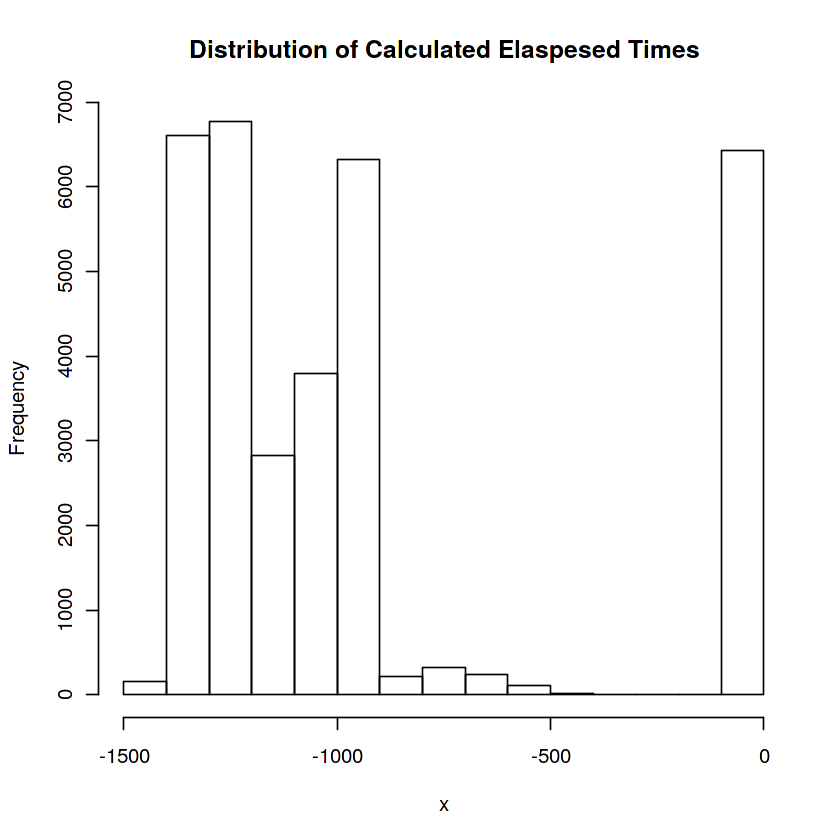

In [12]:
# Find all indexes where the arrival time is before the departure time
# add 24 hours to the arrival time. This is to indicate the the arrival was the next day
index <- which((flights$ARRTIME - flights$DEPTIME) < 0)
temp <- flights[index,]
x<- as.numeric(flights$ARRTIME[index] - flights$DEPTIME[index])
# plot the histogram of the calculated to find which flights arrived the next day. 
# we expect that if a calcualted elapesed time is very large, then it must have arrived the next day 
# this is because these calculations would have considered that the flight came the morning of the departure which doesnt make logical sense
hist(x, main = "Distribution of Calculated Elaspesed Times")

# looking at the plot lets say when x < -400 the flight arrived the next day

# find all the index in flights where the calculated elapsed time is x < -400
index <- index[as.numeric(flights$ARRTIME[index] - flights$DEPTIME[index]) < (-400)]
# for those indexes, add 24 hours to the CRS arrival time and arrival time
flights$CRSARRTIME[index] <- flights$CRSARRTIME[index] + (24*60*60)
flights$ARRTIME[index] <- flights$ARRTIME[index] + (24*60*60)

flights$next_Day[index] <- 'True'
flights$next_Day[!index] <- 'False'

index <- which((flights$ARRTIME - flights$DEPTIME) < 0)
x<- as.numeric(flights$ARRTIME[index] - flights$DEPTIME[index])
hist(x, main = "Distribution of Calculated Elaspesed Times")

index<- which(flights$next_Day == "True")
temp<- flights[index,]
length(index)


# clean the numerical columns. 
# it was found that some columns with NA values are due to the flight being canceled so there is no data

# Looks at missing values between flights canceled and flights diverted
# number of flights cancelled
length(which(flights$CANCELLED == 'True'))
# number of flights diverted
length(which(flights$DIVERTED == 'True'))

# find which indexes are NA values
# find the cases where the flight was canceled and there were filled in values for the departure time 
# this is when the flight had departed from the gate but was cancelled after
index <-which(flights$CANCELLED == 'True' & !is.na(flights$DEPTIME))
# create a tempory subset of the data to look at these cases
temp <- flights[index,]
# 279 NA values
length(index)


# find all cases where flights were not canceled and there was an NA for Actual elapsed time
# this is when the flight was diverted instead 
# 2646 NA values
index <-which(flights$CANCELLED == 'False' & is.na(flights$ACTUALELAPSEDTIME))
temp <- flights[index,]